In [2]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from matplotlib import animation
import cv2
import scipy
import h5py
from wave_prop_module import Wave2d

In [3]:
6.45*1e-3 * 1342, 2*np.pi/0.5328, 650*1e-6/(2*np.sin(np.arctan(4.3/210))), 1392*0.00645*0.5

(8.6559, 11.792765216177902, 0.0158754200555099, 4.4892)

In [39]:
sample = '05_02'
# sample_name = f'samples/Reconstruction/{sample}_05_02.mat'
sample_name = f'samples/2024_01_30_Wolfgangs_Wavefront_Sensor_First_Test/Reconstruction/{sample}.mat'
 
A = np.array(h5py.File(sample_name, 'r').get('A'))
# [0].reshape(1392, 1040)
P = np.array(h5py.File(sample_name, 'r').get('phi'))*1e-6
# *2*np.pi/0.5328
wave_0= A*np.exp(1j*P)
wave_0 = wave_0.T

In [9]:
wave_0.shape, wave_0.dtype

((1040, 1392), dtype('complex128'))

In [10]:
# np.savetxt('05_02.txt', wave_0.ravel().view(float))

In [37]:
# wave_1 = np.loadtxt('05_02.txt').view(complex).reshape([1040, 1392])
# (wave_0 != wave_1).sum()


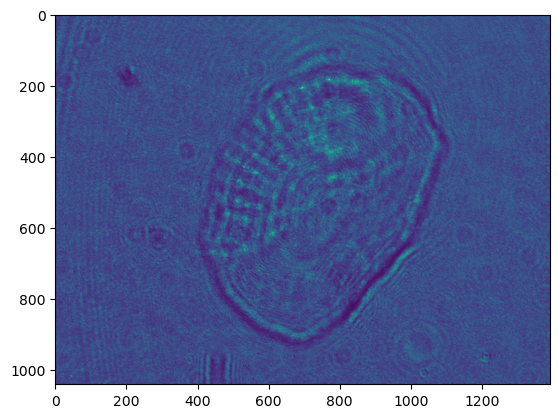

In [40]:
plt.imshow(np.abs(wave_0))
# plt.colorbar()

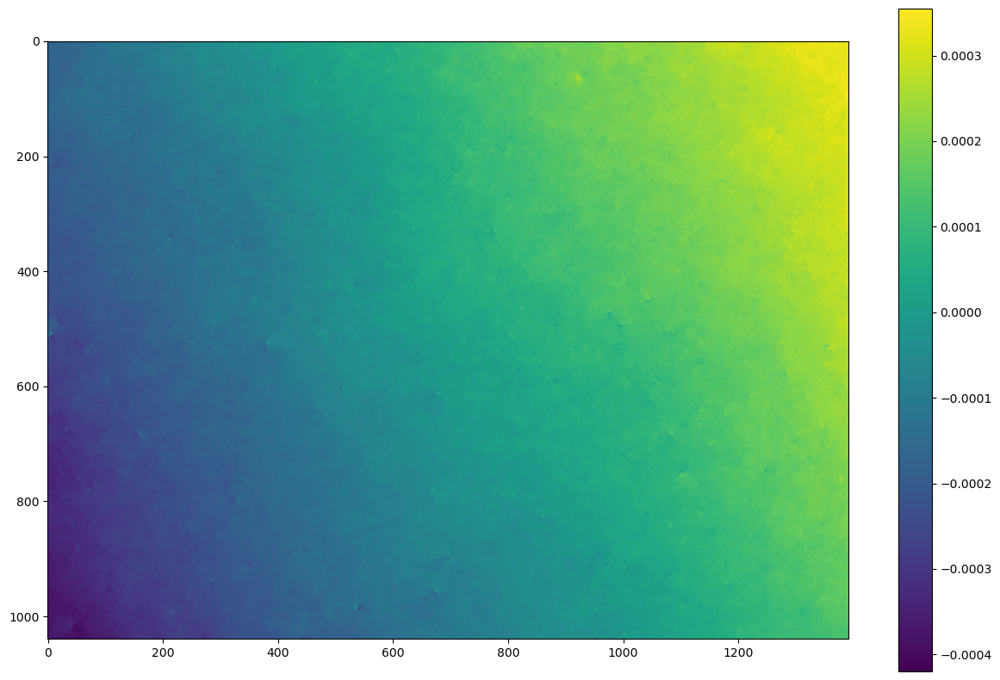

In [41]:
fig, axs = plt.subplots(1, 1, figsize=(15, 10))

phase = P.T
cp_ang = axs.imshow(phase)
fig.colorbar(cp_ang, ax=axs)

plt.show()

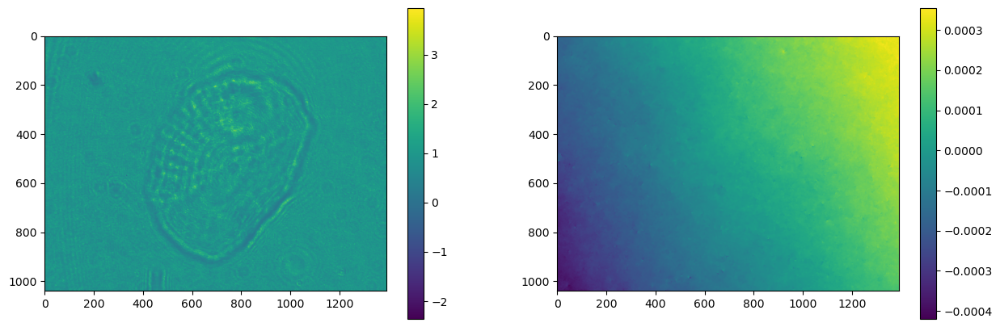

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
cp_amp = axs[0].imshow(A.T)
cp_ang = axs[1].imshow(P.T)

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
plt.show()

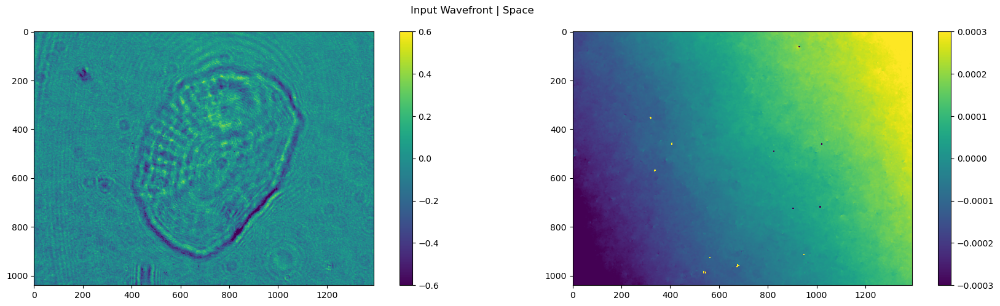

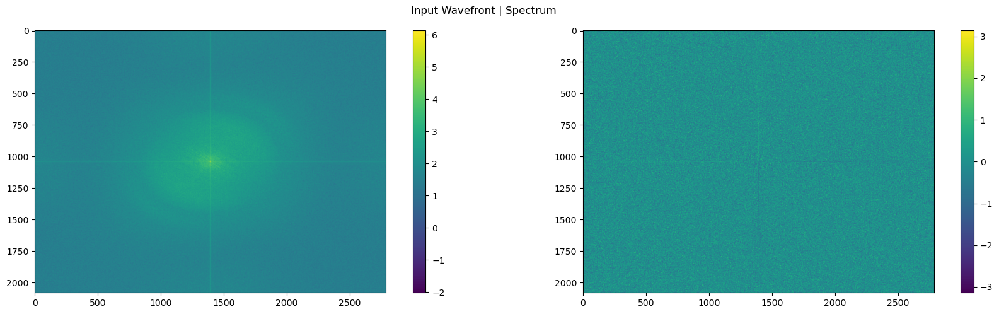

In [43]:
wave_obj = Wave2d(
    numPx = [1392, 1040], 
    sizePx = [0.00645, 0.00645], 
    wl = 650*1e-6
    # wl = 532.8*1e-6
    )

wave_obj.wavefield(wave_0)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.wavefield_z0)), vmax=0.6, vmin=-0.6)
cp_ang = axs[1].imshow((np.angle(wave_obj.wavefield_z0)), vmin=-0.0003, vmax=0.0003)

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z0)))
cp_ang = axs[1].imshow((np.angle(wave_obj.fft_wave_z0)))

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle('Input Wavefront | Spectrum')
plt.show()

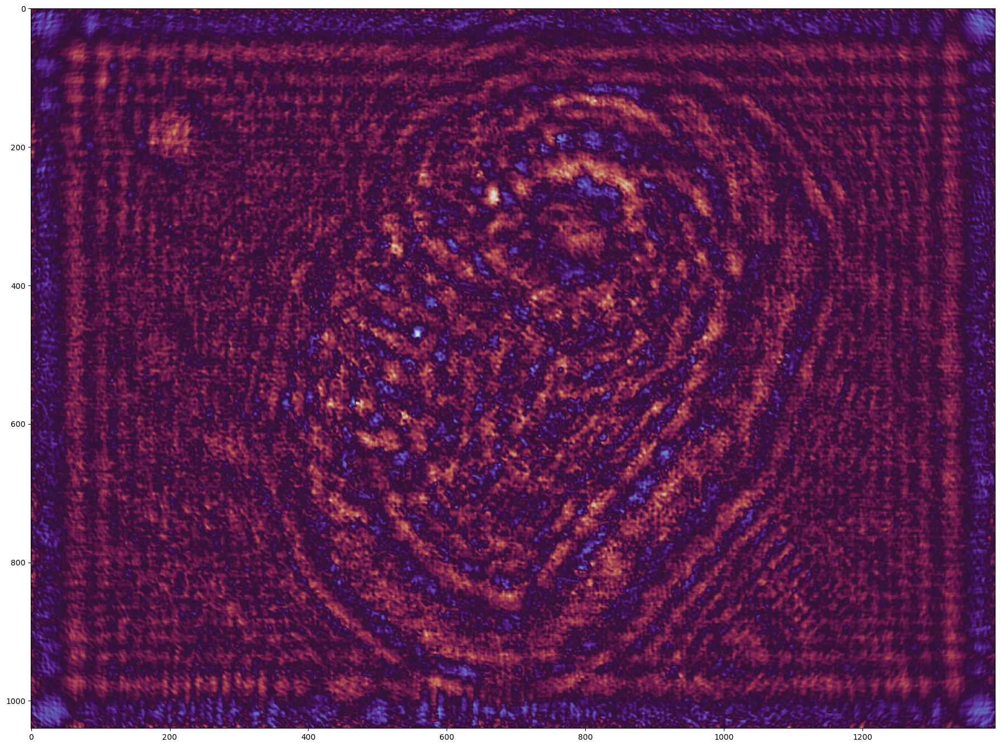

In [44]:
dist = 210 # mm

wave_z = wave_obj.propogate(dist)

fig, axs = plt.subplots(1, 1, figsize=(18, 15), tight_layout=True)
# cp_amp = axs[0].imshow(np.abs(wave_z)**2)
#cp_amp = axs.imshow(np.clip((np.abs(wave_z)**2), -2, 2)**(1/2.2))
cp_ang = axs.imshow(((np.angle(wave_z))),cmap='twilight')
plt.show()

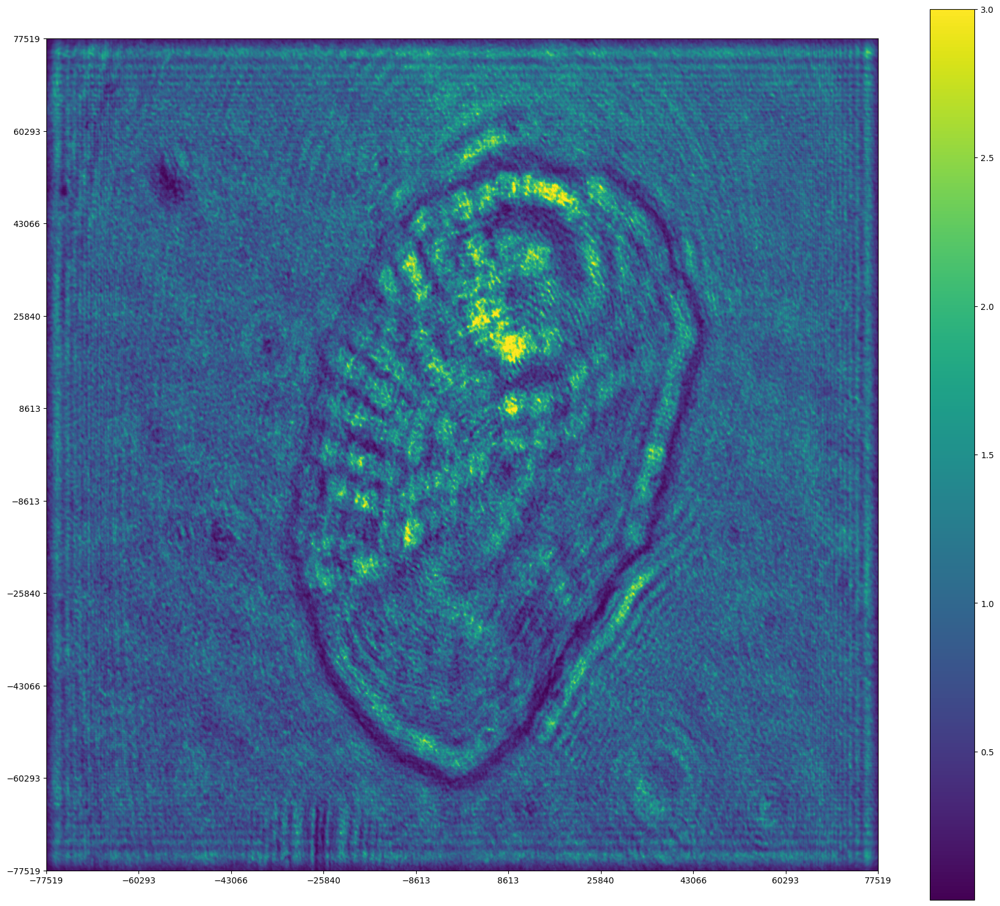

In [45]:
dist = 30 # mm

wave_z = wave_obj.propogate(dist)

fig, axs = plt.subplots(1, 1, figsize=(18, 15), tight_layout=True)
# cp_amp = axs[0].imshow(np.abs(wave_z)**2)
cp_amp = axs.imshow(np.clip((np.abs(wave_z)**2), 0, 3), 
                    extent=[-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), -1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1])])
# **(1/2.2)
# cp_ang = axs.imshow(((np.angle(wave_z))),cmap='twilight')
fig.colorbar(cp_amp, ax=axs)

plt.xticks(np.linspace(-1/(2*wave_obj.sizePx[0]), 1/(2*wave_obj.sizePx[0]), 10))
plt.yticks(np.linspace(-1/(2*wave_obj.sizePx[1]), 1/(2*wave_obj.sizePx[1]), 10))

plt.show()

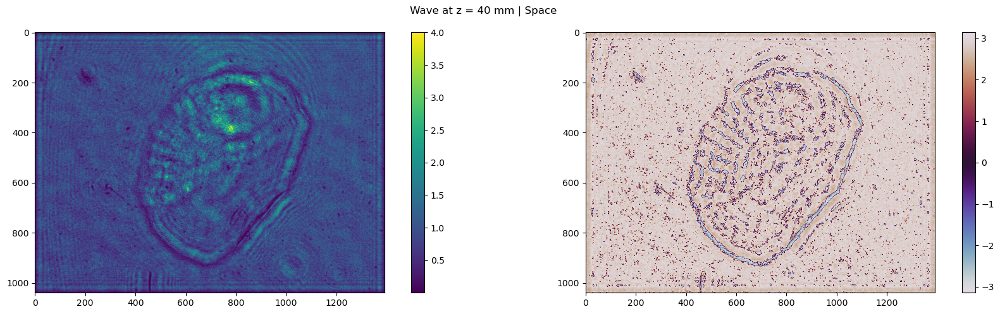

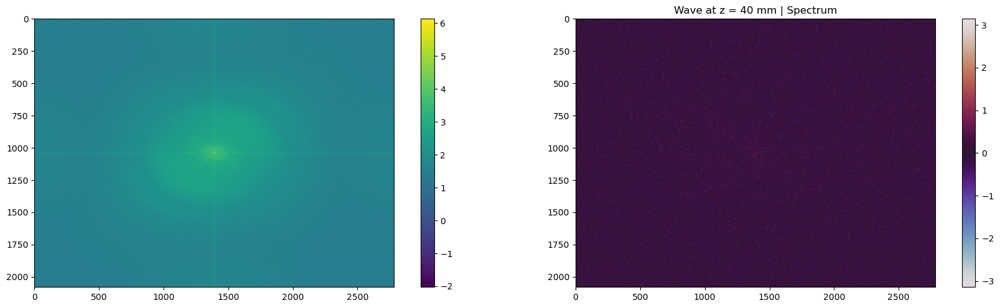

In [57]:
dist = 40 # mm

wave_z = wave_obj.propogate(dist)

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
# cp_amp = axs[0].imshow(np.abs(wave_z)**2)
cp_amp = axs[0].imshow(np.clip((np.abs(wave_z)**2), 0, 4))
cp_ang = axs[1].imshow(((np.angle(wave_z))), cmap='twilight')

fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
fig.suptitle(f'Wave at z = {dist} mm | Space')
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z1)))
from matplotlib import colormaps as cm
cp_ang = axs[1].imshow(np.angle(wave_obj.fft_wave_z1),cmap='twilight' )
# axs[0].ylim([])
fig.colorbar(cp_amp, ax=axs[0])
fig.colorbar(cp_ang, ax=axs[1])
plt.title(f'Wave at z = {dist} mm | Spectrum')
plt.show()

In [554]:
# # dist = 25 # mm

# # video

# for dist in np.linspace(-0.1, 0.1, 11):
#     wave_z = wave_obj.propogate(dist)

#     fig, axs = plt.subplots(1, 2, figsize=(18, 5), tight_layout=True)
#     cp_amp = axs[0].imshow(np.log10(np.abs(wave_z)), vmax=0.15, vmin=-0.35)
#     cp_ang = axs[1].imshow((np.angle(wave_z)))

#     fig.colorbar(cp_amp, ax=axs[0])
#     fig.colorbar(cp_ang, ax=axs[1])
#     fig.suptitle(f'Wave at z = {dist:.4f} mm | Space')
#     plt.show()


#     # plt.title(f'Prop dist: {dist:.4f} | SNR: {np.mean(np.abs(wave_z))/np.std(np.abs(wave_z)):.4f}')
#     # plt.show()

In [301]:
# for dist in np.linspace(-22, -19, 51):
#     wave_z = wave_obj.propogate(dist)

#     wave_amp = np.clip(np.log10(np.abs(wave_z)), -0.35, 0.15)
#     wave_amp = np.array((2**8 - 1)*(wave_amp + 0.35)/(0.15 + 0.35), dtype=np.uint8)
#     # wave_amp = cv2.medianBlur(wave_amp, 7)
#     wave_amp = cv2.applyColorMap(wave_amp, cv2.COLORMAP_PARULA)
    
#     wave_ang = np.angle(wave_z)
#     # wave_ang = (wave_ang + np.pi)

#     # wave_amp_ang_cat = cv2.hconcat([wave_amp, wave_ang])

#     # cv2.imshow('Frame', cv2.resize(wave_amp_ang_cat, (800, 640)))

#     cv2.putText(wave_amp, f'z={dist:.6f} mm', (1150, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, 250, 2, 2)
#     cv2.imshow('Frame', wave_amp)

#     # add waitKey for video to display
#     key = cv2.waitKey(1)

#     if key == ord('q'):
#         # do not close window, you want to show the frame
#         cv2.destroyAllWindows()
#         break

# cv2.destroyAllWindows()

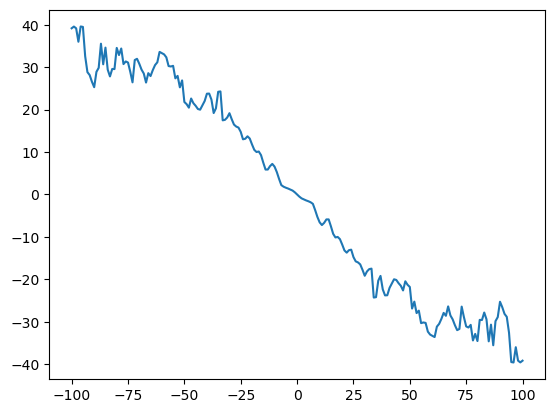

In [574]:
diff_arr = []
for dist in np.linspace(-100, 100, 201):

    wave_z = wave_obj.propogate(dist)
    img_1 = np.abs(wave_z)**2

    wave_z = wave_obj.propogate(-1*dist)
    img_2 = np.abs(wave_z)**2

    diff_arr.append(np.sum(img_2 - img_1))

plt.plot(np.linspace(-100, 100, 201), diff_arr)

In [567]:
writer = cv2.VideoWriter(
    # filename = f"samples/2024_01_30_Wolfgangs_Wavefront_Sensor_First_Test/Reconstruction/Propogation/{sample}_250.mp4",  #Provide a file to write the video to
    fourcc = cv2.VideoWriter_fourcc(*'mp4v'),            #Use whichever codec works for you...
    fps = 10,                                        #How many frames do you want to display per second in your video?
    frameSize = (wave_amp.shape[1], wave_amp.shape[0]),
    isColor = True
    )      

for ind, dist in enumerate(np.linspace(-250, 250, 501)):
    wave_z = wave_obj.propogate(dist)

    # wave_amp = np.clip(np.log10(np.abs(wave_z)), -0.35, 0.15)
    # wave_amp = np.array((2**8 - 1)*(wave_amp + 0.35)/(0.15 + 0.35), dtype=np.uint8)
    # wave_amp = cv2.medianBlur(wave_amp, 7)

    wave_amp = np.clip((np.abs(wave_z)**2), 0, 4)
    # **(1/2.2)
    wave_amp = np.array((2**8 - 1)*(wave_amp - np.min(wave_amp))/(np.max(wave_amp) - np.min(wave_amp)), dtype=np.uint8)
    wave_amp = cv2.applyColorMap(wave_amp, cv2.COLORMAP_PARULA)

    if ind % 15 == 0:
        text = f'z={dist:.6f} mm'
    cv2.putText(wave_amp, text, (1150, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, 250, 2, 2)
    
    writer.write(wave_amp)
writer.release()

In [303]:
wave_obj.setup_limit_info()

Max Freq and Angle the camera/plane can record without aliasing: 77.51937984496124 cycles/mm | 0.08260465116279068 radians
Max Freq and Angle the setup allows (freqs > do not reach the next plane): (83.91919238421387, 62.809296735157744) cycles/mm | (0.044712145702309136, 0.03346479330049204) radians


In [304]:
# for dist in np.linspace(0, 25, 11):
#     wave_z = wave_obj.propogate(dist)

#     fig, axs = plt.subplots(1, 2, figsize=(15, 5))
#     cp_amp = axs[0].imshow(np.log10(np.abs(wave_obj.fft_wave_z1)))
#     cp_ang = axs[1].imshow(np.unwrap(np.angle(wave_obj.fft_wave_z1)))

#     axs[0].grid('on')
#     axs[1].grid('on')

#     fig.colorbar(cp_amp, ax=axs[0])
#     fig.colorbar(cp_ang, ax=axs[1])
#     plt.title(f'Propagation distance: {dist}')
#     plt.show()